In [3]:
import numpy as np
import numpy.ma as ma
from scipy.ndimage import correlate
from skimage.io import imread
from skimage.io import imsave
from skimage.color import rgb2gray
from skimage.filters import sobel
from skimage.transform import resize
from skimage.draw import ellipse
import matplotlib.pyplot as plt
import time

# ===================
# ====== UTILS ======
# ===================

def path_random (field) :
    fh = field.shape[0]
    fw = field.shape[1]
    scol = np.random.randint(fw)
    path = [(0, scol)] 
    for row in range(1, fh) :
        scol_off = np.random.randint(-1, 2)
        scol += scol_off
        scol = np.clip(scol, 0, fw-1)
        path.append((row, scol))
        
    return np.array(path).swapaxes(0, 1)

def path_greedy (field) :    
    fh = field.shape[0]
    fw = field.shape[1]
    scol = np.argmin(field[0])
    path = [(0, scol)]
    for row in range(1, fh) :
        cstart = np.clip(scol-1, 0, fw)
        cend = np.clip(scol+2, 0, fw)
        scol = np.argmin(field[row][cstart:cend]) + cstart
        path.append((row, scol))
    
    return np.array(path).swapaxes(0, 1)

def cost_map (energy_map) :   
    mh = energy_map.shape[0]
    mw = energy_map.shape[1]
    cost_map = np.copy(energy_map)
    for row in range(1, mh) :
        prow = np.pad(cost_map[row-1], (1, 1), 'constant', constant_values=float('inf'))
        sections = []
        for col in range(prow.size-2) :
            sections.append(prow[col:col+3])
        sections = np.array(sections)
        mins = np.min(sections, axis=1)
        np.add(mins, cost_map[row], cost_map[row])
        
    return cost_map

def remove_path (field, path) :
    fh = field.shape[0]
    fw = field.shape[1]
    field = np.delete(field, fw*path[0]+path[1])
    field = field.reshape(fh, fw-1)
    
    return field

'''
translates the relative coordinates of a series of 
seams in the coordinates of the original image

this should not be used for seam carving
'''
def translate_seam (imo, seams) :
    seams = np.array(seams)
    if len(seams.shape) == 2 :
        seams = np.expand_dims(seams, axis=0)
      
    index_map = np.mgrid[0:imo.shape[0], 0:imo.shape[1]]
    index_map = np.dstack(index_map)
    if seams[0].shape[1] == imo.shape[1] :
        imo = np.rot90(imo)
        index_map = np.rot90(index_map)
        seams = np.roll(seams, 1, axis=1)
    
    imh = imo.shape[0]
    imw = imo.shape[1]
    
    
    tseams = []
    for s in seams :
        ts = index_map[s[0], s[1]].swapaxes(0, 1)
        tseams.append(ts)
        
        index_map = index_map.reshape(-1, 2)
        index_map = np.delete(index_map, imw*s[0]+s[1], axis=0)
        imw -= 1
        index_map = index_map.reshape(imh, imw, 2)
    tseams = np.array(tseams)
    
    return tseams

def energy (im, type='gradient') :
    img = rgb2gray(im)
    
    if type == 'gradient' :
        f = np.array([[0,0,0],[-1,1,0],[0,0,0]])
        xdif = correlate(img, f, origin=1)
        ydif = correlate(img, f.transpose(), origin=1)
        energy = np.absolute(xdif) + np.absolute(ydif)
    
    if type == 'sobel' :
        energy = sobel(img)
        
    return energy

In [4]:
'''
returns array of indices representing seam pixels
the seams in the returned array are dependant on one onther meaning that 
any seam's indices are relative to the image carved using the previous seams
'''
def seam (energy, k, mode, strat='dynamic') :
    energy_map = np.copy(energy)
    if mode == 'horizontal' :
        energy_map = np.rot90(energy) 

    if k > energy_map.shape[1] :
        raise ValueError('can\'t carve more seams than the sizes of the energy')

    seams = []
    for i in range(k) :
        mh = energy_map.shape[0]
        mw = energy_map.shape[1]
        
        if strat == 'random' :
            iseam = path_random(energy_map)

        if strat == 'greedy' : 
            iseam = path_greedy(energy_map)

        if strat == 'dynamic' :
            ecost_map = cost_map(energy_map)
            
            iseam = path_greedy(np.flipud(ecost_map))
            # flip the order of the rows
            iseam[0] = np.flip(iseam[0], axis=0)
        
        # carving out the previously found seam
        energy_map = remove_path(energy_map, iseam)
        
        if mode == 'horizontal' :
            iseam = np.roll(iseam, 1, axis=0)
        seams.append(iseam)

        
    seams = np.array(seams)
    
    return seams

def seam_carve (im, energy, k, mode, strat='dynamic') :
    if mode == 'horizontal' :
        im = np.rot90(im)
        energy = np.rot90(energy)
    else :
        im = np.copy(im)
        energy = np.copy(energy)
        
    seams = seam(energy, k, 'vertical', strat)
    
    imh = im.shape[0]
    imw = im.shape[1]
    fim = im.reshape(-1, 3)
    for s in seams :
        fim = np.delete(fim, imw*s[0]+s[1], axis=0)
        imw -= 1
    imc = fim.reshape(imh, imw, 3)
    
    if mode == 'horizontal' :
        imc = np.rot90(imc, 3)
    
    return imc

In [5]:
def seam_duplicate (im, energy, k, mode, mark=False, markc = [255, 0, 0]) :
    if mode == 'horizontal' :
        im = np.rot90(im)
        energy = np.rot90(energy)
        
    seams = seam(energy, k, 'vertical', 'dynamic')   
    seams = translate_seam(im, seams)
    
    marker_map = np.zeros(im.shape[0:2], dtype=np.uint8)
    im = np.dstack((im, marker_map))
    for s in seams :
        im[s[0], s[1], 3] = 1
    
    items = markc
    nim = np.zeros((1, im.shape[1]+k, 3), dtype=np.uint8)
    for row in im :
        nrow = row[:, 0:3]
        iinsert = np.argwhere(row[:, 3] == 1).squeeze()
        if not mark :
            items = nrow[iinsert]
        nrow = np.insert(nrow, iinsert, items, axis=0)
        nrow = np.expand_dims(nrow, 0)
        nim = np.vstack((nim, nrow))
    
    nim = nim[1:, :, 0:3]
    if mode == 'horizontal' :
        nim = np.rot90(nim, 3)
        
    return nim

In [6]:
def amplify_content (im, p) :
    p = p / 100
    imh = im.shape[0]
    imw = im.shape[1]
    
    height_add = int(imh * p)
    width_add = int(imw * p)
    new_height = imh + height_add
    new_width = imw + width_add
    
    im = resize(im, (new_height, new_width), mode='constant')
    
    im_energy = energy(im, 'sobel')
    im = seam_carve(im, im_energy, height_add, 'horizontal', 'dynamic')
    
    im_energy = energy(im, 'sobel')
    im = seam_carve(im, im_energy, width_add, 'vertical', 'dynamic')
    
    return im

In [8]:
images = {
    'arc' : imread('./data/arcTriumf.jpg'),
    'castel': imread('./data/castel.jpg'),
    'delfin': imread('./data/delfin.jpeg'),
    'praga': imread('./data/praga.jpg'),
    
    'delfin2': imread('./data/delfin2.jpg'),
    'padure': imread('./data/forest.jpg'),
    'cristina': imread('./data/lady.jpg'),
    'noapte': imread('./data/night.jpg'),
    'parc': imread('./data/park.jpg'),
    'palm': imread('./data/palm.jpg'),
    'playboy': imread('./data/playboy.jpg')
}

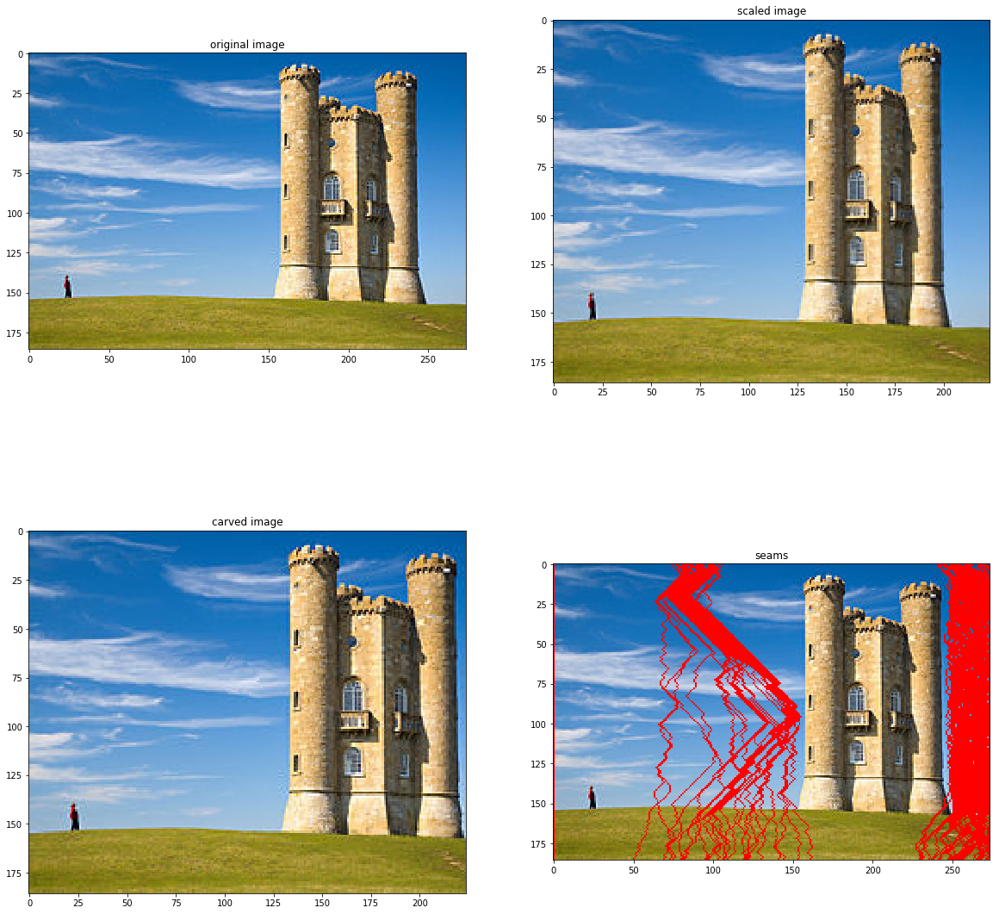

In [9]:
# ===============================
# ===== taiere pe verticala =====
# ===============================

im = images['castel']
im_energy = energy(im, 'sobel')

width_delta = 50
im_scaled = resize(im, (im.shape[0], im.shape[1]-width_delta), mode='constant')
im_carved = seam_carve(im, im_energy, width_delta, 'vertical')

seams = translate_seam(im, seam(im_energy, width_delta, 'vertical'))
im_marked = np.copy(im)
for s in seams :
    im_marked[s[0], s[1], :] = [255, 0, 0]


plt.figure(figsize=(20, 20))

plt.subplot(221)
plt.title('original image')
plt.imshow(im)

plt.subplot(222)
plt.title('scaled image')
plt.imshow(im_scaled)

plt.subplot(223)
plt.title('carved image')
plt.imshow(im_carved)

plt.subplot(224)
plt.title('seams')
plt.imshow(im_marked)

plt.show()

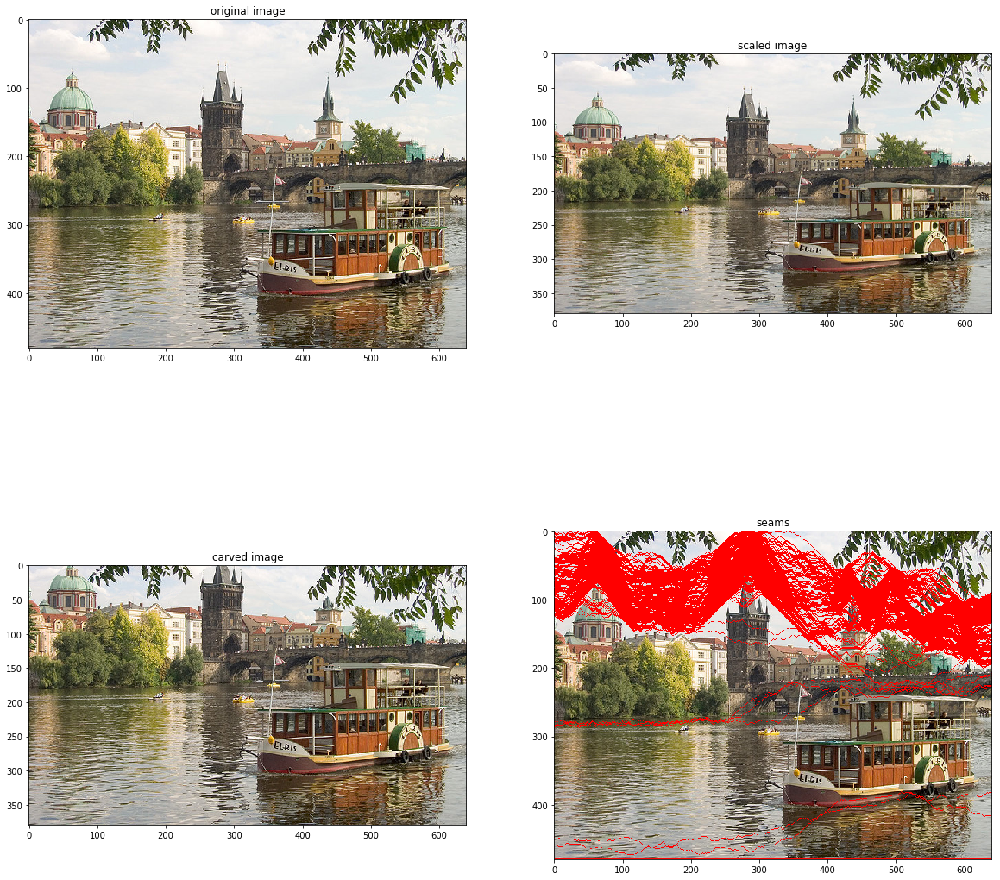

In [125]:
# ================================
# ===== taiere pe orizontala =====
# ================================

im = images['praga']
im_energy = energy(im, 'sobel')

width_delta = 100
im_scaled = resize(im, (im.shape[0]-width_delta, im.shape[1]), mode='constant')
im_carved = seam_carve(im, im_energy, width_delta, 'horizontal')

seams = translate_seam(im, seam(im_energy, width_delta, 'horizontal'))
im_marked = np.copy(im)
for s in seams :
    im_marked[s[0], s[1], :] = [255, 0, 0]


plt.figure(figsize=(20, 20))

plt.subplot(221)
plt.title('original image')
plt.imshow(im)

plt.subplot(222)
plt.title('scaled image')
plt.imshow(im_scaled)

plt.subplot(223)
plt.title('carved image')
plt.imshow(im_carved)

plt.subplot(224)
plt.title('seams')
plt.imshow(im_marked)

plt.show()

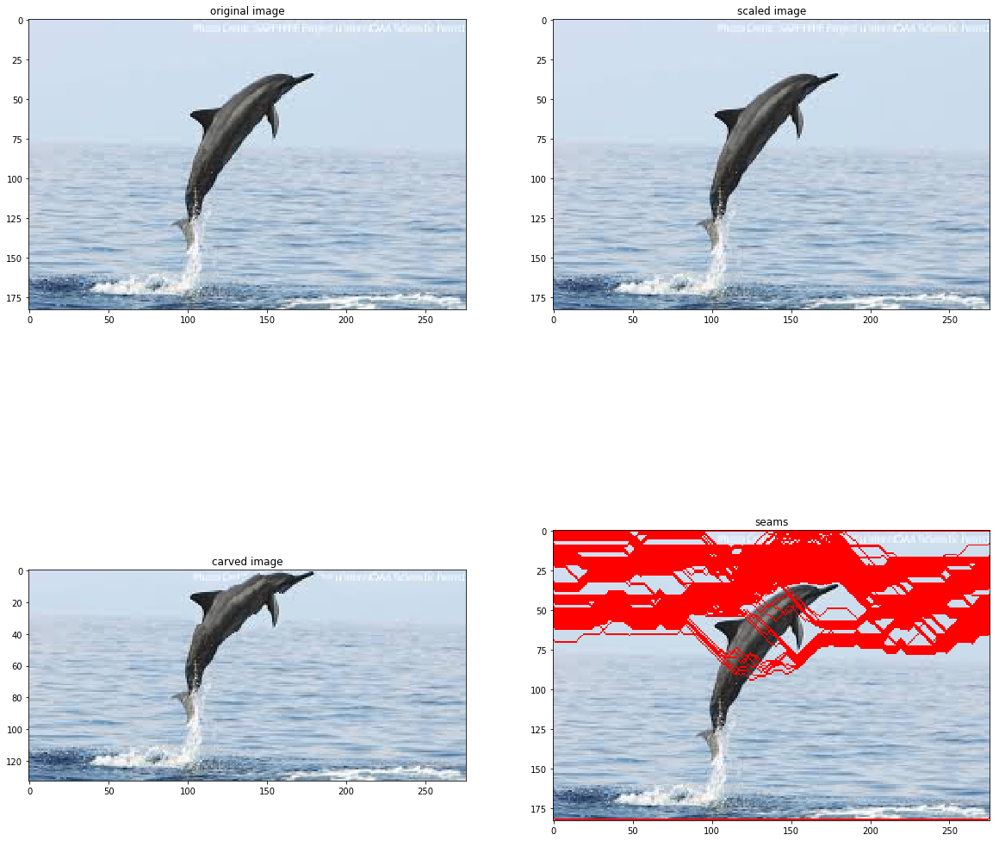

In [7]:
# ================================
# ===== taiere pe orizontala =====
# ================================

im = images['delfin']
im_energy = energy(im, 'sobel')

width_delta = 50
im_scaled = resize(im, (im.shape[0], im.shape[1]), mode='constant')
im_carved = seam_carve(im, im_energy, width_delta, 'horizontal')

seams = translate_seam(im, seam(im_energy, width_delta, 'horizontal'))
im_marked = np.copy(im)
for s in seams :
    im_marked[s[0], s[1], :] = [255, 0, 0]


plt.figure(figsize=(20, 20))

plt.subplot(221)
plt.title('original image')
plt.imshow(im)

plt.subplot(222)
plt.title('scaled image')
plt.imshow(im_scaled)

plt.subplot(223)
plt.title('carved image')
plt.imshow(im_carved)

plt.subplot(224)
plt.title('seams')
plt.imshow(im_marked)

plt.show()

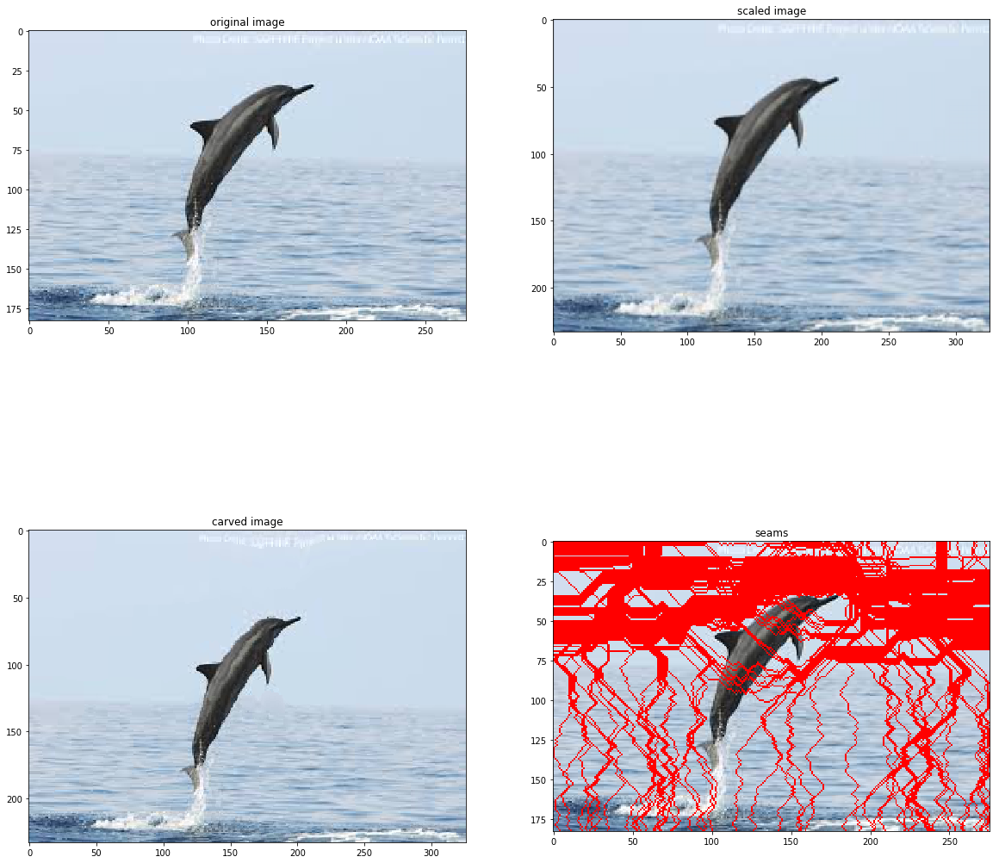

In [131]:
# ==================
# ===== marire =====
# ==================

im = images['delfin']
im_energy = energy(im, 'sobel')

size_delta = 50
im_scaled = resize(im, (im.shape[0]+size_delta, im.shape[1]+size_delta), mode='constant')

im_carvedv = seam_duplicate(im, im_energy, size_delta, 'vertical')
im_energy = energy(im_carvedv)
im_carved = seam_duplicate(im_carvedv, im_energy, size_delta, 'horizontal')

im_energy = energy(im)
seams = translate_seam(im, seam(im_energy, size_delta, 'vertical'))
im_marked = np.copy(im)
for s in seams :
    im_marked[s[0], s[1], :] = [255, 0, 0]
    
seams = translate_seam(im, seam(im_energy, size_delta, 'horizontal'))
for s in seams :
    im_marked[s[0], s[1], :] = [255, 0, 0]


plt.figure(figsize=(20, 20))

plt.subplot(221)
plt.title('original image')
plt.imshow(im)

plt.subplot(222)
plt.title('scaled image')
plt.imshow(im_scaled)

plt.subplot(223)
plt.title('carved image')
plt.imshow(im_carved)

plt.subplot(224)
plt.title('seams')
plt.imshow(im_marked)

plt.show()

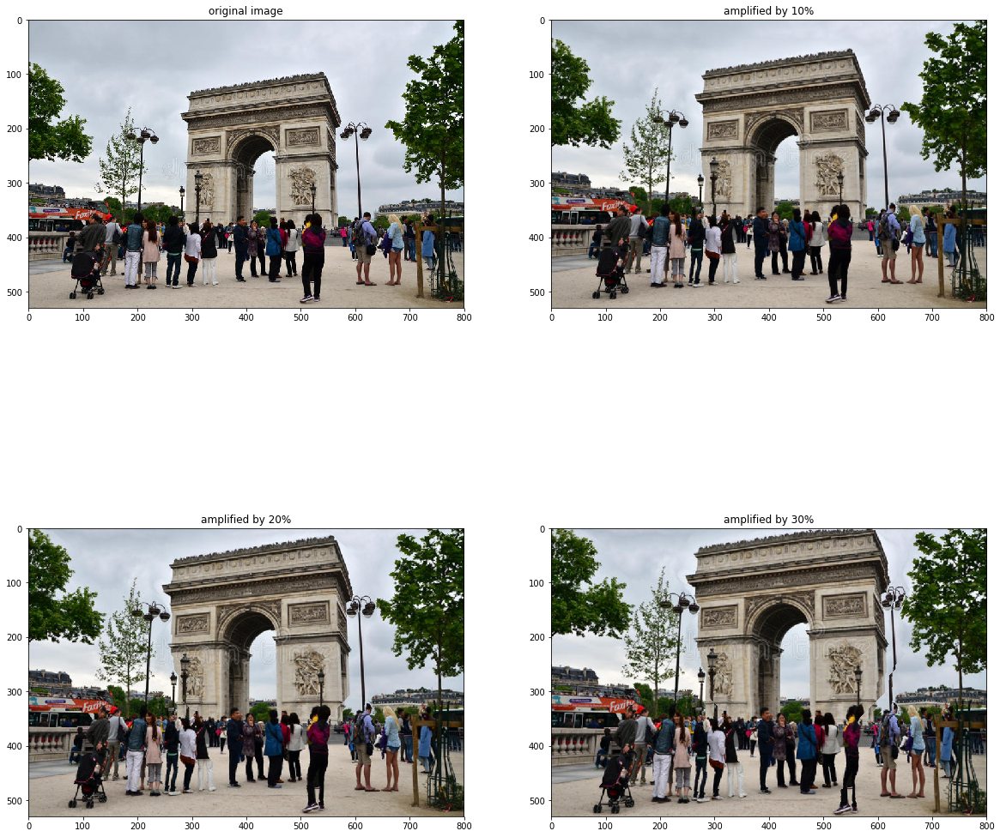

In [133]:
# =======================
# ===== amplificare =====
# =======================

im = images['arc']
im_energy = energy(im, 'sobel')

scale_percent1 = 10
scale_percent2 = 20
scale_percent3 = 30

im_amplify1 = amplify_content(im, scale_percent1)
im_amplify2 = amplify_content(im, scale_percent2)
im_amplify3 = amplify_content(im, scale_percent3)

plt.figure(figsize=(20, 20))

plt.subplot(221)
plt.title('original image')
plt.imshow(im)

plt.subplot(222)
plt.title('amplified by 10%')
plt.imshow(im_amplify1)

plt.subplot(223)
plt.title('amplified by 20%')
plt.imshow(im_amplify2)

plt.subplot(224)
plt.title('amplified by 30%')
plt.imshow(im_amplify3)

plt.show()

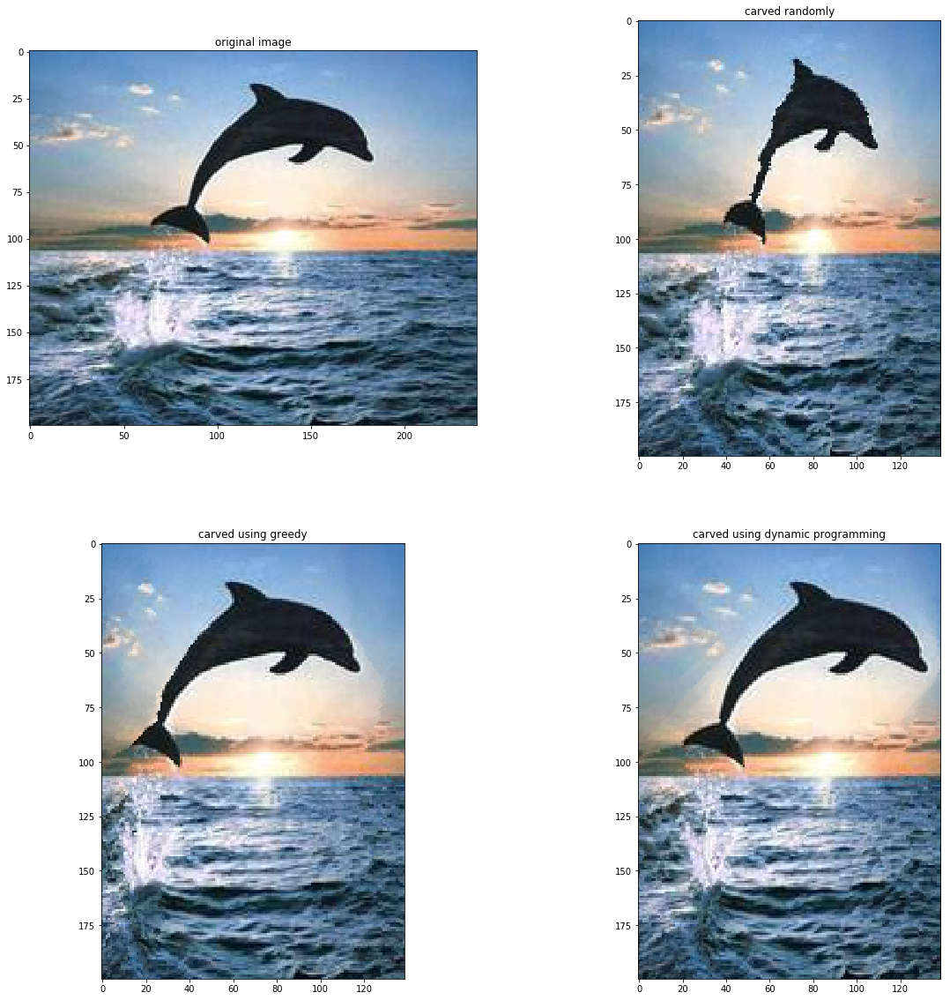

In [144]:
im = images['delfin2']
im_energy = energy(im)

k = 100
im_random = seam_carve(im, im_energy, k, 'vertical', 'random')
im_greedy = seam_carve(im, im_energy, k, 'vertical', 'greedy')
im_dynamic = seam_carve(im, im_energy, k, 'vertical', 'dynamic')

plt.figure(figsize=(20, 20))

plt.subplot(221)
plt.title('original image')
plt.imshow(im)

plt.subplot(222)
plt.title('carved randomly')
plt.imshow(im_random)

plt.subplot(223)
plt.title('carved using greedy')
plt.imshow(im_greedy)

plt.subplot(224)
plt.title('carved using dynamic programming')
plt.imshow(im_dynamic)

plt.show()

dict_keys(['arc', 'castel', 'delfin', 'praga', 'delfin2', 'padure', 'cristina', 'noapte', 'parc'])


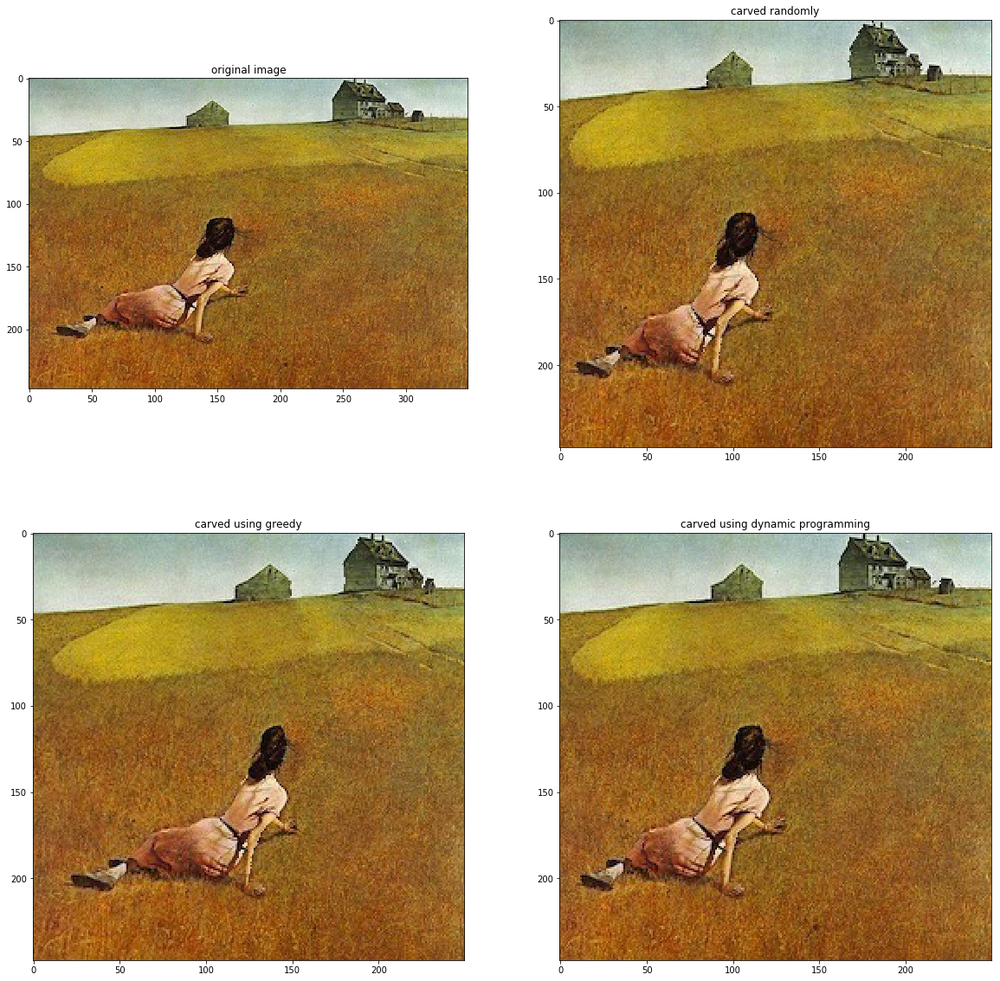

In [146]:
im = images['cristina']
im_energy = energy(im)

k = 100
im_random = seam_carve(im, im_energy, k, 'vertical', 'random')
im_greedy = seam_carve(im, im_energy, k, 'vertical', 'greedy')
im_dynamic = seam_carve(im, im_energy, k, 'vertical', 'dynamic')

plt.figure(figsize=(20, 20))

plt.subplot(221)
plt.title('original image')
plt.imshow(im)

plt.subplot(222)
plt.title('carved randomly')
plt.imshow(im_random)

plt.subplot(223)
plt.title('carved using greedy')
plt.imshow(im_greedy)

plt.subplot(224)
plt.title('carved using dynamic programming')
plt.imshow(im_dynamic)

plt.show()

dict_keys(['arc', 'castel', 'delfin', 'praga', 'delfin2', 'padure', 'cristina', 'noapte', 'parc'])


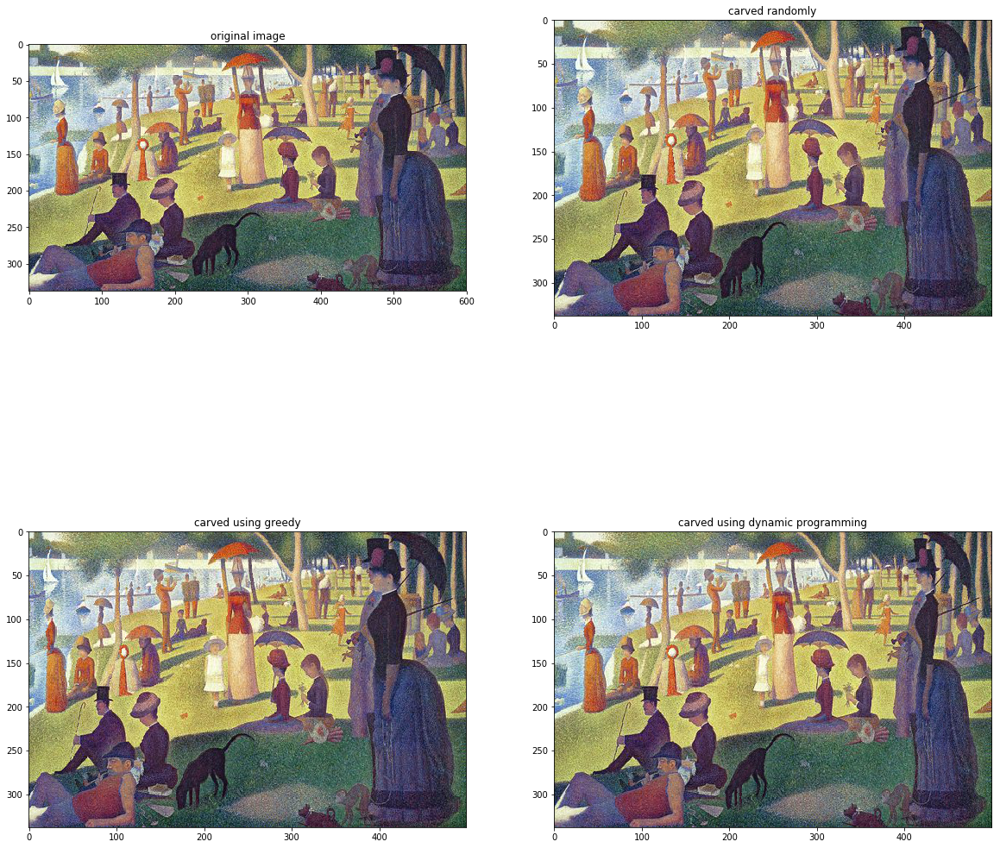

In [149]:
im = images['parc']
im_energy = energy(im)

k = 100
im_random = seam_carve(im, im_energy, k, 'vertical', 'random')
im_greedy = seam_carve(im, im_energy, k, 'vertical', 'greedy')
im_dynamic = seam_carve(im, im_energy, k, 'vertical', 'dynamic')

plt.figure(figsize=(20, 20))

plt.subplot(221)
plt.title('original image')
plt.imshow(im)

plt.subplot(222)
plt.title('carved randomly')
plt.imshow(im_random)

plt.subplot(223)
plt.title('carved using greedy')
plt.imshow(im_greedy)

plt.subplot(224)
plt.title('carved using dynamic programming')
plt.imshow(im_dynamic)

plt.show()

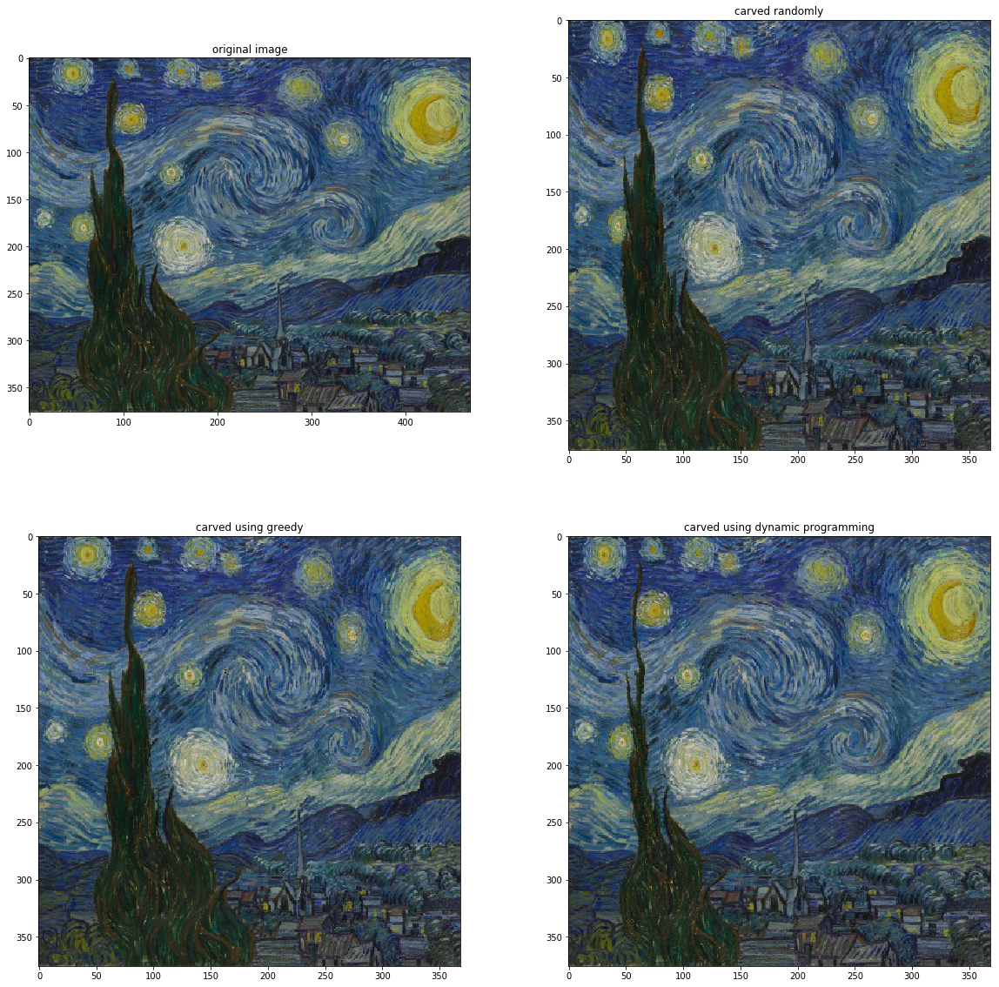

In [151]:
im = images['noapte']
im_energy = energy(im)

k = 100
im_random = seam_carve(im, im_energy, k, 'vertical', 'random')
im_greedy = seam_carve(im, im_energy, k, 'vertical', 'greedy')
im_dynamic = seam_carve(im, im_energy, k, 'vertical', 'dynamic')

plt.figure(figsize=(20, 20))

plt.subplot(221)
plt.title('original image')
plt.imshow(im)

plt.subplot(222)
plt.title('carved randomly')
plt.imshow(im_random)

plt.subplot(223)
plt.title('carved using greedy')
plt.imshow(im_greedy)

plt.subplot(224)
plt.title('carved using dynamic programming')
plt.imshow(im_dynamic)

plt.show()

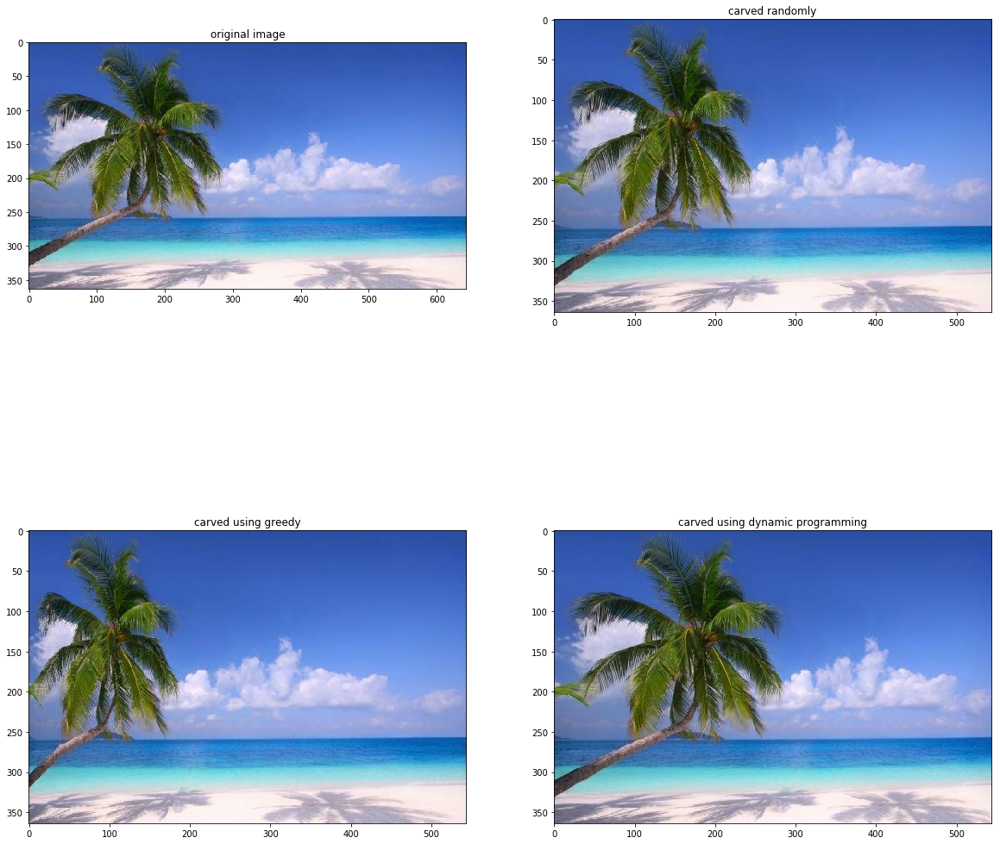

In [155]:
im = images['palm']
im_energy = energy(im)

k = 100
im_random = seam_carve(im, im_energy, k, 'vertical', 'random')
im_greedy = seam_carve(im, im_energy, k, 'vertical', 'greedy')
im_dynamic = seam_carve(im, im_energy, k, 'vertical', 'dynamic')

plt.figure(figsize=(20, 20))

plt.subplot(221)
plt.title('original image')
plt.imshow(im)

plt.subplot(222)
plt.title('carved randomly')
plt.imshow(im_random)

plt.subplot(223)
plt.title('carved using greedy')
plt.imshow(im_greedy)

plt.subplot(224)
plt.title('carved using dynamic programming')
plt.imshow(im_dynamic)

plt.show()

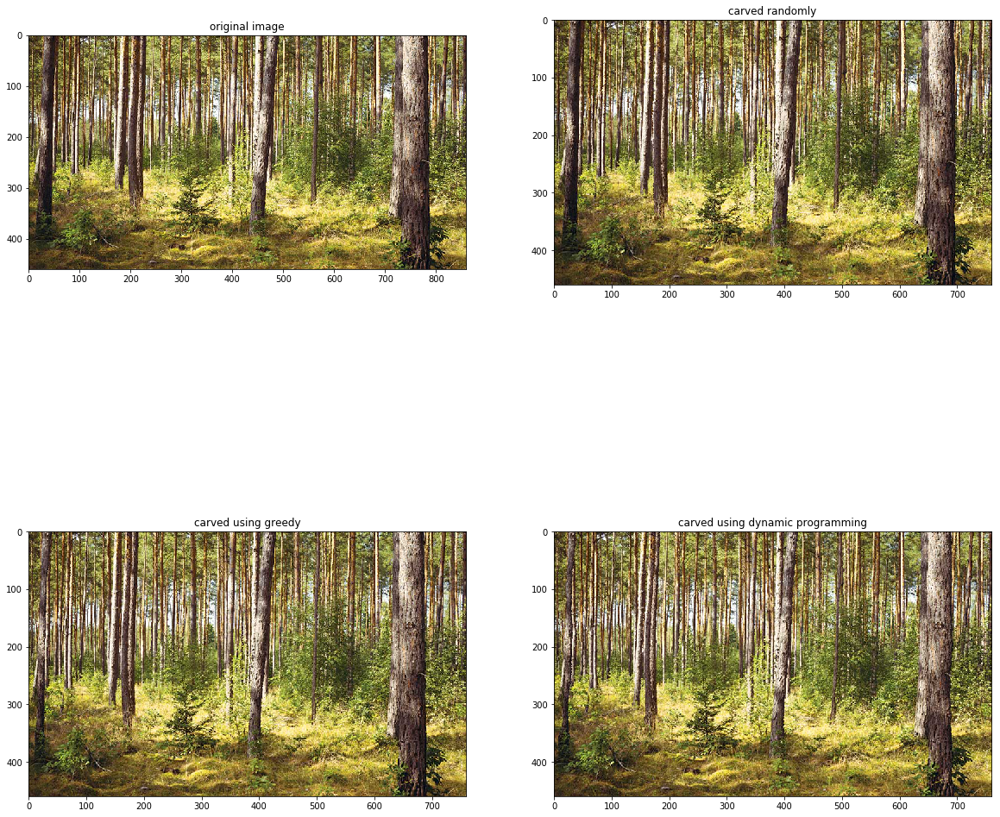

In [157]:
im = images['padure']
im_energy = energy(im)

k = 100
im_random = seam_carve(im, im_energy, k, 'vertical', 'random')
im_greedy = seam_carve(im, im_energy, k, 'vertical', 'greedy')
im_dynamic = seam_carve(im, im_energy, k, 'vertical', 'dynamic')

plt.figure(figsize=(20, 20))

plt.subplot(221)
plt.title('original image')
plt.imshow(im)

plt.subplot(222)
plt.title('carved randomly')
plt.imshow(im_random)

plt.subplot(223)
plt.title('carved using greedy')
plt.imshow(im_greedy)

plt.subplot(224)
plt.title('carved using dynamic programming')
plt.imshow(im_dynamic)

plt.show()

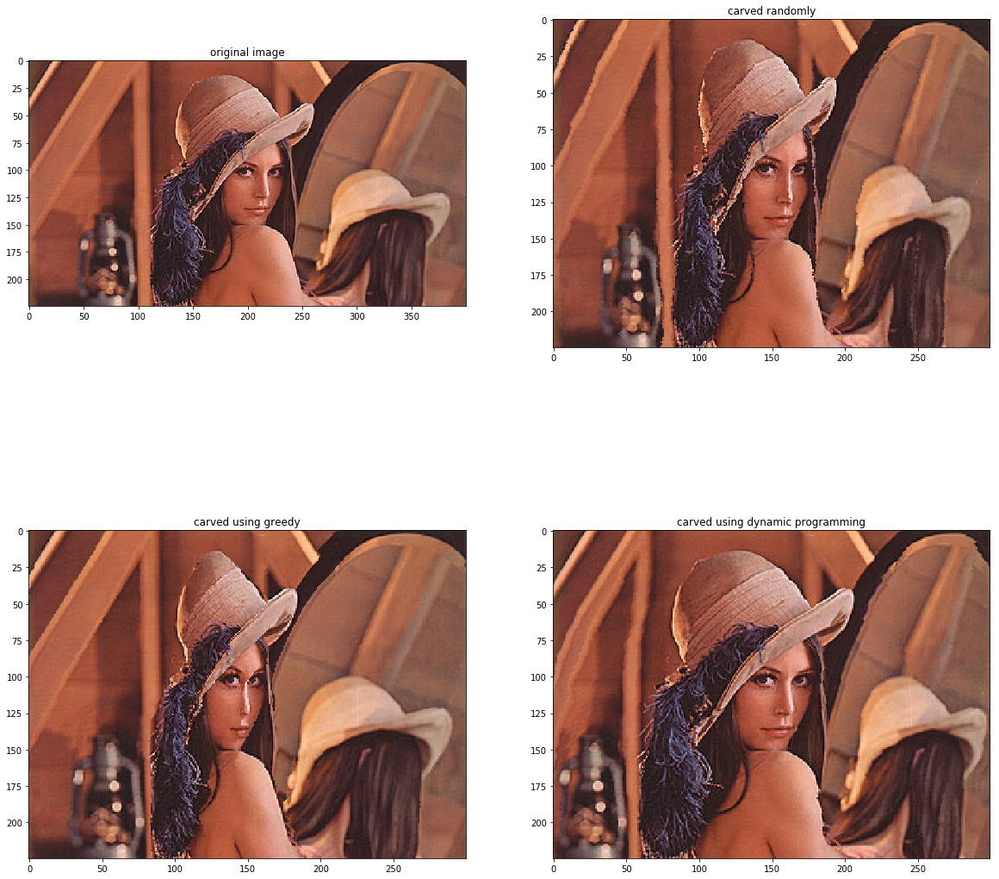

In [160]:
im = images['playboy']
im_energy = energy(im)

k = 100
im_random = seam_carve(im, im_energy, k, 'vertical', 'random')
im_greedy = seam_carve(im, im_energy, k, 'vertical', 'greedy')
im_dynamic = seam_carve(im, im_energy, k, 'vertical', 'dynamic')

plt.figure(figsize=(20, 20))

plt.subplot(221)
plt.title('original image')
plt.imshow(im)

plt.subplot(222)
plt.title('carved randomly')
plt.imshow(im_random)

plt.subplot(223)
plt.title('carved using greedy')
plt.imshow(im_greedy)

plt.subplot(224)
plt.title('carved using dynamic programming')
plt.imshow(im_dynamic)

plt.show()